In [2]:
# 라이브러리 임포트
import os
import json
import pandas as pd
import numpy as np

In [3]:
# 폴더 및 파일명 설정
base_dir = './Data/EST_data' # 현재 폴더
label_folders = ['label_train', 'label_val', 'label_test']
img_dirs = {
    'train': os.path.join(base_dir, 'img_train'),
    'val': os.path.join(base_dir, 'img_val'),
    'test': os.path.join(base_dir, 'img_test')
}
label_targets = ['anger', 'happy', 'panic', 'sadness']

In [4]:
# backbone 클래스 순서 (labels = model.config.id2label 기반) 0, 1, 2, 3, 4, 5, 6, 7 로 각각 매핑됨
backbone_classes = ['anger', 'contempt', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

# 라벨러 감정 7종 → 백본 클래스 soft label 매핑 (수정 가능)
annotation_to_backbone_map = {
    "기쁨":    {"happy": 1.0},
    "당황":    {"fear": 0.4, "surprise": 0.6},      # 소프트
    "분노":    {"anger": 0.5, "contempt": 0.3, "disgust": 0.2}, # 소프트
    "불안":    {"fear": 1.0},
    "상처":    {"sad": 1.0},
    "슬픔":    {"sad": 1.0},
    "중립":    {"neutral": 1.0}
}

# 라벨러가 부여한 감정 레이블을 백본 클래스별 소프트 라벨로 변환하는 함수
def create_soft_label(annotations, 
                      backbone_classes=backbone_classes,
                      label_map=annotation_to_backbone_map):
    """
    annotations: 라벨러가 부여한 감정 레이블(str) 리스트
    backbone_classes: 백본 클래스 이름 리스트 (순서 엄수)
    label_map: 라벨러 감정 → backbone 클래스별 soft dict mapping
    """
    soft_label = np.zeros(len(backbone_classes), dtype=float)
    for ann in annotations:
        if ann in label_map:
            for class_name, weight in label_map[ann].items():
                idx = backbone_classes.index(class_name)  # 안전성: 없는 경우 try-except 증가 권장
                soft_label[idx] += weight
    if len(annotations) > 0:
        soft_label /= len(annotations)
    return soft_label.tolist()


== 샘플 5개: train/anger (./Data/EST_data/label_train/train_anger.json) ==
#1 파일명: 6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#2 파일명: 65rsfe402042f34319e10128c1ab9614e2f967690a64a0016f2c49ff33fe7sy3z.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#3 파일명: b1cbe34734870cc11c33334e02bea93ac3a3b061caab62c0df1c6b9c75430tquz.jpg
annotation: ['상처', '불안', '슬픔']
----------------------------------------
#4 파일명: llfycc0aa29599cc63cace3610fdaaad3a99aab2ee38c9edb6c10966765bbwd5f.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#5 파일명: 3hww73b70615461a7336d0383b53582f8bf804f6e0f30d64f36fb410038b82m2u.jpg
annotation: ['기쁨', '분노', '분노']
----------------------------------------


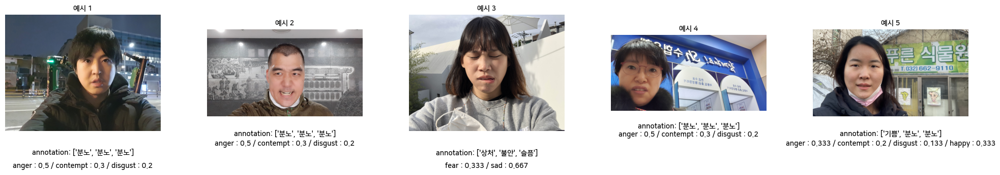


== 샘플 5개: train/happy (./Data/EST_data/label_train/train_happy.json) ==
#1 파일명: 1ssf46b4695747c6e323bf090389b57049cff58a0851d50d3de8c0dc5ccb7lemg.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#2 파일명: hfbl2d0622517ad6ef5456d1fa4e7d52f57ff1dff320944fe34fade7feb33ns68.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#3 파일명: eg9e62a9cfcd9eabbe75c79dd12d99e99cdd9960ba9dafdb798c9776fec77ukjn.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#4 파일명: w0l5595485285b029508299b09d058cb30ebcd29459c529c09ee340a160039f54.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#5 파일명: 4g3x46eb8169fa9c636ecfe93eac6996299ca02d6596c3ffc365480ee0621ph96.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------


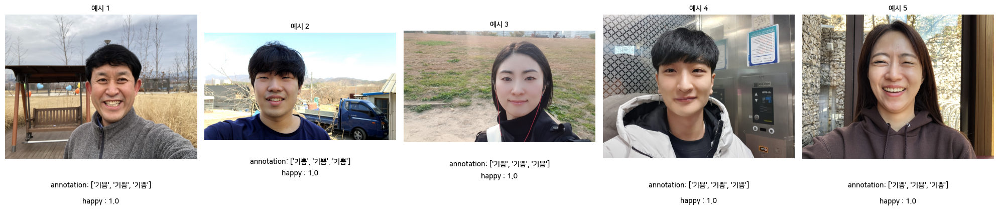


== 샘플 5개: train/panic (./Data/EST_data/label_train/train_panic.json) ==
#1 파일명: twdva8d723865fa1005873a6967797c75f3dd83197f13f7daa3e3926947071al6.jpg
annotation: ['중립', '당황', '당황']
----------------------------------------
#2 파일명: tfcq8e7c42da5f56ce61f3ef372a3fe8339f467040796623e586ce3d73a97o5w4.jpg
annotation: ['당황', '중립', '중립']
----------------------------------------
#3 파일명: 1x46281aba4fc588baac2be45c9ef57caaa788a14aa2bc58b228a8408c4a5ss9y.jpg
annotation: ['당황', '불안', '불안']
----------------------------------------
#4 파일명: 6lh809d8c75d0e1378b8d5996d86937375e05ec7f690b49cfb5bdd9638b90s661.jpg
annotation: ['당황', '중립', '당황']
----------------------------------------
#5 파일명: b8jncedf78d645e27401f4b66fb8c36fb9c6e71d669dd9bd68ebd8cec3714zs5a.jpg
annotation: ['당황', '당황', '당황']
----------------------------------------


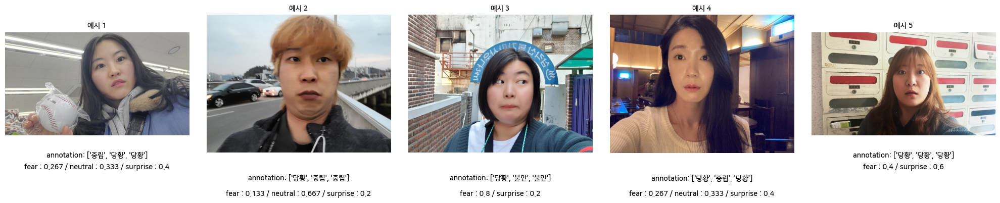


== 샘플 5개: train/sadness (./Data/EST_data/label_train/train_sadness.json) ==
#1 파일명: xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba48231105a61ca6abmrz.jpg
annotation: ['슬픔', '기쁨', '중립']
----------------------------------------
#2 파일명: j3lrc2f227a917cd03e9177b2ce7da237e5d2a91a6e1210c8293922d202d5dw8x.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------
#3 파일명: plxg3fd368ea807fe7d76d986ed20c53d1db0d623c2603f0bd20b6dbf7bb2ohxl.jpg
annotation: ['슬픔', '중립', '슬픔']
----------------------------------------
#4 파일명: 887j5e59c505c555b892c184dd258555c910ea327819094d3793b2ef550d0vmnq.jpg
annotation: ['슬픔', '슬픔', '불안']
----------------------------------------
#5 파일명: qfm5c74ba24f8e9ba31f42ba683915b6a927f8222529a433a722e7a3c30a4crx2.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------


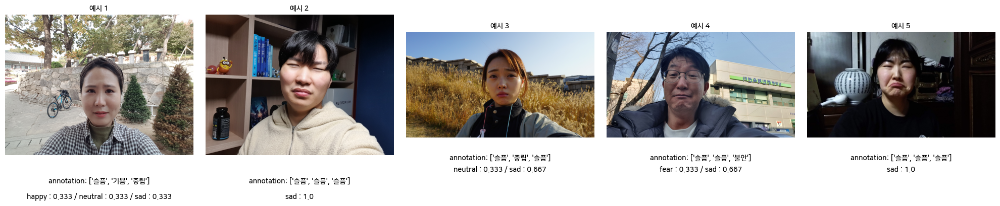


== 샘플 5개: val/anger (./Data/EST_data/label_val/val_anger.json) ==
#1 파일명: 7uji1c8ab7778bc286c3cd90077847f9a906f00b210838ba57877a29abd60ffix.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#2 파일명: qokw201acdd0f74c7794a9ddcbc9cabdf9c79dd711cbed27d0cd91a20bf19z1bj.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#3 파일명: tzg8926848c43051598de35ece59588857ce02af1699541b88484a1bede3ev7xl.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#4 파일명: w4vh9e941e6c400f03df009496eaa1f639e73d8ec8104c171d67416108553j55a.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#5 파일명: qii07233b67c5d41cb109e19d2d14309cb177b43f40698d3f422d470280619go4.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------


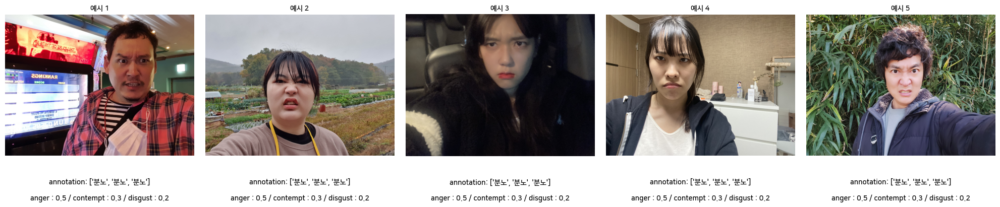


== 샘플 5개: val/happy (./Data/EST_data/label_val/val_happy.json) ==
#1 파일명: toq8051c689cc18111cbe3eb6e976bbcb917dc787e868fb09ec1d7bc76c9fbpmo.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#2 파일명: 7buz79e78c54eefc8ce51f75e363e5356fcc35f7cdb797e54d73d7daeae2e6ba3.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#3 파일명: cdxmfebe8892936b85394c3878134b1e1a3a8a28865763b95ed75b812e9cez3wk.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#4 파일명: n0kmf7a95be77c999b0e788bf81ee337979a7e78734985e2b31c163937723jcfi.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#5 파일명: agxl9759549b79b0fecb5b0d604fe0089bf2d95b930ebf7a8494fa8c8a5b6a4yd.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------


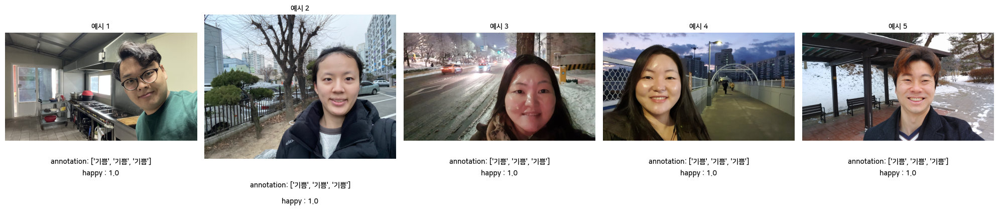


== 샘플 5개: val/panic (./Data/EST_data/label_val/val_panic.json) ==
#1 파일명: 5wvv711e387717375fc2d050c253bddc47f702574e5d4e630947fd3bfd45b63vr.jpg
annotation: ['당황', '당황', '당황']
----------------------------------------
#2 파일명: bah3e6ebf4124d8dd4a76c5624072dc082d5f062a8cc422f9a6d643a5bc44b3bj.jpg
annotation: ['불안', '당황', '당황']
----------------------------------------
#3 파일명: w29v711b8e595b16be3990c859815fe7b6ee0c1110c1121771a06a0127925fowx.jpg
annotation: ['당황', '불안', '당황']
----------------------------------------
#4 파일명: f7xt648b78b2d283a1e8d72d608857817e2e7e169c286a1a81ec981deaa23bqzb.jpg
annotation: ['당황', '상처', '상처']
----------------------------------------
#5 파일명: y4n7ec880686e6168d2c7b8070bf8df98caa216ab13886ed85a507c7fe2fc2th9.jpg
annotation: ['상처', '분노', '상처']
----------------------------------------


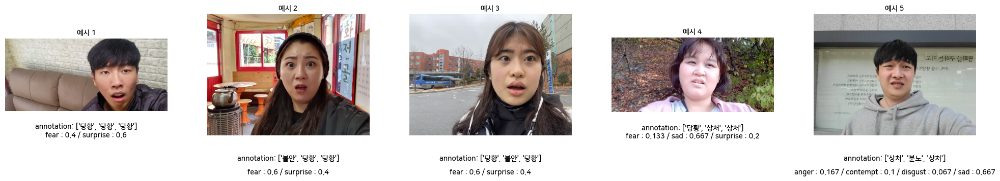


== 샘플 5개: val/sadness (./Data/EST_data/label_val/val_sadness.json) ==
#1 파일명: qwah77a0193244b0482281a281fc40efaf821fcbbcd89b24f4b872c01889dhvyf.jpg
annotation: ['슬픔', '상처', '상처']
----------------------------------------
#2 파일명: nkm368d6e713877d5833435d5891e8cf73d683184f536f76c516aff88a08fp08a.jpg
annotation: ['중립', '중립', '분노']
----------------------------------------
#3 파일명: l03pc556d534a0336462a1f3499313bb553a9ccaa4dc31dfcb5755b0f1aa79bwa.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------
#4 파일명: uk8849444ada058ba43d43a73fd8bc37fc5ba4c48623e27799ca86aa0fd80xlgy.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------
#5 파일명: we5x47511a48ae6fe6540d491995a09470a46e07046b0b9d58996597a9994sfk5.jpg
annotation: ['분노', '불안', '슬픔']
----------------------------------------


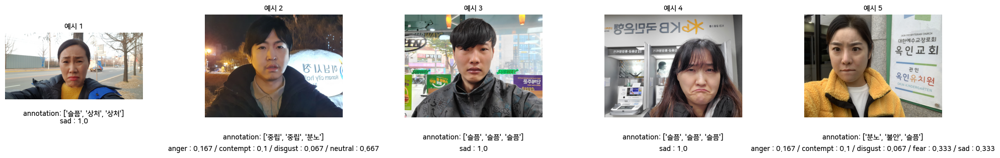


== 샘플 5개: test/anger (./Data/EST_data/label_test/test_anger.json) ==
#1 파일명: q347e9fe539cb67cc112ec595fa351e0ae0ab1e57027fb595c7190e1911ddkwas.jpg
annotation: ['분노', '불안', '분노']
----------------------------------------
#2 파일명: n8k53439edaa3fd087cd64e0cdffb51b3ed78af9476c79c4e03606f9bb4f755ck.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#3 파일명: zm6t9255f092886de2c9bc8819c55cee98d28c1a36500e59bb4049f824ebbrbwv.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#4 파일명: xdq10b215a7aabf82c30cb477cdd4823e8c1baa4838201042b9b0bcec08aexn2h.jpg
annotation: ['분노', '분노', '분노']
----------------------------------------
#5 파일명: o312ddd59e8f15955220465e825529352f6d1ed1b50513e47813f6f915fa2wkci.jpg
annotation: ['분노', '당황', '분노']
----------------------------------------


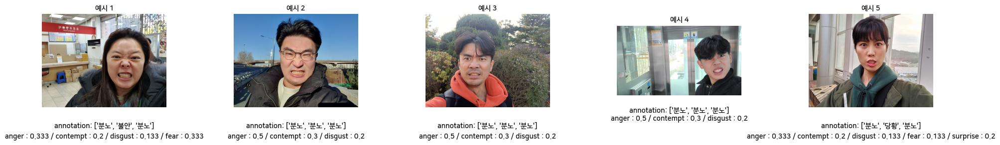


== 샘플 5개: test/happy (./Data/EST_data/label_test/test_happy.json) ==
#1 파일명: sczhaaba375db745e235b22ae0ab258add024a82456ea9302a54262e074b2fna2.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#2 파일명: d61b74c4c57cc88d011bca78f4239673cbb47484b17d8ac337f6c2f1c9435e8bf.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#3 파일명: mvut5c2503dff0127202efd2d0ee11b55990f0f74c06898ed50210bd125f19ju3.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#4 파일명: u7g6433c6735ff35c2035b8f7437798514f0133b7ec2eb3c2ce2e935d0d46irg7.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------
#5 파일명: 6ivdbc0cc9433d5649c0921cd05d22670b2cd9240dd39964ac16da95dddaccb2j.jpg
annotation: ['기쁨', '기쁨', '기쁨']
----------------------------------------


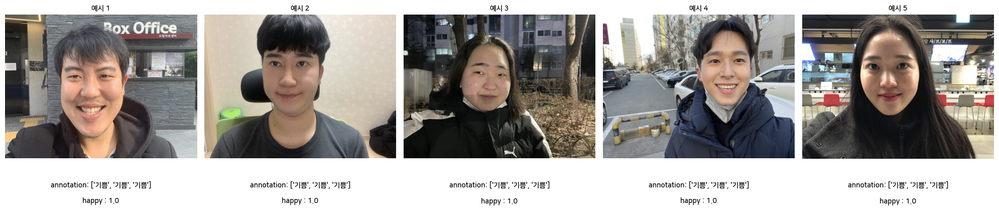


== 샘플 5개: test/panic (./Data/EST_data/label_test/test_panic.json) ==
#1 파일명: cq4u5330f8ad082c75efdcc72d7c344cd3097303b70eed7e0d5937ff25f336v8f.jpg
annotation: ['중립', '중립', '당황']
----------------------------------------
#2 파일명: 9efc20ce96215cc3ff9e631e157c4269e3c1c25ec0c58837e4ce29e7cfe6dghks.jpg
annotation: ['당황', '상처', '당황']
----------------------------------------
#3 파일명: yff37ec4bfa2dd6839c132972e918a7dbbf7c0a716b89629477c1b7fd098f6h10.jpg
annotation: ['당황', '당황', '당황']
----------------------------------------
#4 파일명: zoza676dfbeabdedf68d204bd2d5d2de8dbb06d796e888e8e86c0dfddd6ab0tqq.jpg
annotation: ['당황', '당황', '당황']
----------------------------------------
#5 파일명: lzpp3ea04aedfff4548965a4c318e18a27cbd27a5d6e6c5c7c933a5d1288febf4.jpg
annotation: ['상처', '당황', '당황']
----------------------------------------


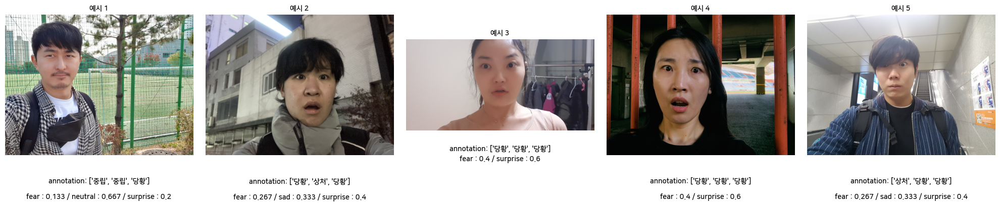


== 샘플 5개: test/sadness (./Data/EST_data/label_test/test_sadness.json) ==
#1 파일명: 6v8555554d550ece347361d2c2bdcc0d145bdb4c273674d555167bdb10a47l4ls.jpg
annotation: ['슬픔', '불안', '슬픔']
----------------------------------------
#2 파일명: xlq3927d22f7781ab1afcc92dd3f0dd963210f2192a7a8f37727277d3372dd9ni.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------
#3 파일명: g4d3d2bb951fbbd9c5971d218b6cdb4863872b33820d1fd3867b774668267xg71.jpg
annotation: ['슬픔', '슬픔', '슬픔']
----------------------------------------
#4 파일명: 0hjp0ed05edcce6560cb5aca50ed588a9030a3deae64ade5865cce5958288c625.jpg
annotation: ['분노', '슬픔', '슬픔']
----------------------------------------
#5 파일명: ifea34779bc9499b4f097bb10954a5b7c7bb022a0c4d9d579cb745d79b784d94q.jpg
annotation: ['상처', '슬픔', '중립']
----------------------------------------


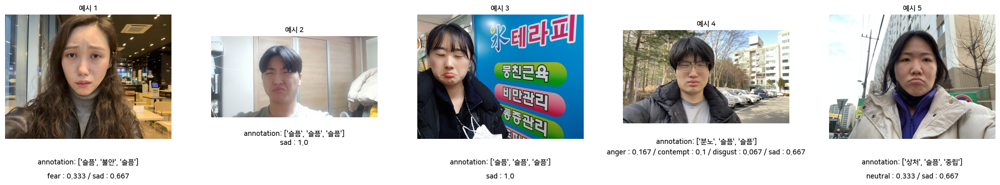

In [ ]:
# 예시 확인
import os
import json
from PIL import Image, ExifTags
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 폰트 설정 (한글용)
font_path = "/usr/share/fonts/truetype/nanum/NanumSquareB.ttf" # 실제 파일경로
font_prop = fm.FontProperties(fname=font_path)

# orientation 보정 함수
def correct_image_orientation(img):
    try:
        exif = img._getexif()
        if exif is not None:
            for tag, value in exif.items():
                if ExifTags.TAGS.get(tag, None) == 'Orientation':
                    if value == 1:
                        pass
                    elif value == 2:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT)
                    elif value == 3:
                        img = img.rotate(180, expand=True)
                    elif value == 4:
                        img = img.transpose(Image.FLIP_TOP_BOTTOM)
                    elif value == 5:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT).rotate(-90, expand=True)
                    elif value == 6:
                        img = img.rotate(-90, expand=True)
                    elif value == 7:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT).rotate(90, expand=True)
                    elif value == 8:
                        img = img.rotate(90, expand=True)
    except Exception:
        pass
    return img

# 임포트 및 변수 세팅(생략)
# backbone_classes, annotation_to_backbone_map 등 필수 변수/함수 선언 필요
# create_soft_label 함수도 반드시 적용된 상태여야 함
for phase, lab_folder in zip(['train', 'val', 'test'], label_folders):
    lab_path = os.path.join(base_dir, lab_folder)
    for target in label_targets:
        # json 파일명
        if phase == 'train': file_name = f'train_{target}.json'
        elif phase == 'val': file_name = f'val_{target}.json'
        else: file_name = f'test_{target}.json'
        json_fp = os.path.join(lab_path, file_name)
        if not os.path.isfile(json_fp): continue

        print(f"\n== 샘플 5개: {phase}/{target} ({json_fp}) ==")
        with open(json_fp, "r", encoding="euc-kr") as f:
            data = json.load(f)
        
        # 이미지 폴더 경로 계산
        img_folder = os.path.join(img_dirs[phase], target)
        
        # 이미지 표시용 figure 생성
        n = min(5, len(data))
        fig, axes = plt.subplots(1, n, figsize=(4*n,5))
        if n == 1: axes = [axes] # 단일 이미지일 때
        
        # 샘플 5개 처리
        for idx, item in enumerate(data[:5]):
            filename = item['filename']
            annotations = [
                item['annot_A']['faceExp'].strip(),
                item['annot_B']['faceExp'].strip(),
                item['annot_C']['faceExp'].strip()
            ]
            soft_label = create_soft_label(annotations)
            img_path = os.path.join(img_folder, filename)
            
            print(f"#{idx+1} 파일명: {filename}")
            print(f"annotation: {annotations}")
            # print(f"soft_label: {[f'{v:.3f}' for v in soft_label]} ({backbone_classes})")
            
            # 이미지 띄우기
            ax = axes[idx]
            if os.path.isfile(img_path):
                img = Image.open(img_path)
                img = correct_image_orientation(img)
                img = img.convert('RGB')
                ax.imshow(img)
                # ax.set_title(filename, fontsize=9)
                ax.set_title(f"예시 {idx+1}", fontsize=13, fontproperties=font_prop)
            else:
                ax.set_title("Missing", fontsize=8)

            # 아래 annotation, softlabel 출력
            label_str = " / ".join([f"{k} : {round(v,3)}" for k, v in zip(backbone_classes, soft_label) if v > 0])
            # 아래 text (annotation + soft_label)
            ann_str = f"annotation: {annotations}"
            # 아래쪽에 두 줄로 (annotation, soft label)
            ax.text(0.5, -0.16, ann_str, ha='center', va='top', wrap=True, fontsize=10, transform=ax.transAxes, fontproperties=font_prop)
            ax.text(0.5, -0.27, label_str, ha='center', va='top', wrap=True, fontsize=10, transform=ax.transAxes, fontproperties=font_prop)
            ax.axis('off')
        # 남은 subplots 비우기
        for ax in axes[n:]:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

In [9]:
# 전체 데이터 프레임 누적용
full_df = []

for phase, lab_folder in zip(['train','val','test'], label_folders):
    lab_path = os.path.join(base_dir, lab_folder)
    for target in label_targets:
        # json 파일명 다름 주의: train_anger.json, val_anger.json, test_anger.json 등
        if phase == 'train': file_name = f'train_{target}.json'
        elif phase == 'val': file_name = f'val_{target}.json'
        else: file_name = f'test_{target}.json'
        json_fp = os.path.join(lab_path, file_name)
        if not os.path.isfile(json_fp): continue

        with open(json_fp, "r", encoding="euc-kr") as f:
            data = json.load(f)

        img_folder = os.path.join(img_dirs[phase], target)
        # 이미지 파일 set 구성
        if os.path.isdir(img_folder):
            img_files = set(os.listdir(img_folder))
        else:
            img_files = set()

        # 샘플별 soft label 생성 및 경로매칭
        for item in data:
            filename = item['filename']
            annotations = [
                item['annot_A']['faceExp'].strip(),
                item['annot_B']['faceExp'].strip(),
                item['annot_C']['faceExp'].strip()
            ]
            soft_label = create_soft_label(annotations)
            img_path = os.path.join(img_folder, filename)
            # 실제 파일 존재 여부 체크 및 기록
            file_exists = os.path.isfile(img_path)
            # DB 누적: [phase, target, filename, img_path, file_exists, annotations..., soft_label...]
            row = {
                "phase": phase,
                "category": target,
                "filename": filename,
                "img_path": img_path,
                "exists": file_exists,
                "annot_A": annotations[0],
                "annot_B": annotations[1],
                "annot_C": annotations[2]
            }
            for i, cl in enumerate(backbone_classes):
                row[f"soft_{cl}"] = soft_label[i]
            full_df.append(row)

# Pandas DB화
df = pd.DataFrame(full_df)

In [10]:
df[df['exists'] == False]

,phase,category,filename,img_path,exists,annot_A,annot_B,annot_C,soft_anger,soft_contempt,soft_disgust,soft_fear,soft_happy,soft_neutral,soft_sad,soft_surprise


In [ ]:
# 실제로 존재하는 이미지만 남기고싶으면:
# df = df[df['exists']]

# 백본 학습용 csv로 export
df.to_csv("softlabel_dataset.csv", index=False)